In [1]:
"""
WSOD with Dedicated Spatial Attention Module
Freezes backbone, trains only spatial attention layer + FC
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score
import timm
import cv2

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

c:\Users\Edrill-LT\Documents\Projects\Python\Thoracic-Disease-Classifier-ResNet50\.torch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


In [2]:
# ============================================================================
# Spatial Attention Module
# ============================================================================

class SpatialAttentionModule(nn.Module):
    """
    Learnable spatial attention module
    Takes features from backbone and outputs spatial attention weights
    """
    def __init__(self, in_channels=2048, reduction=8):
        super(SpatialAttentionModule, self).__init__()
        
        # Spatial attention pathway
        self.conv1 = nn.Conv2d(in_channels, in_channels // reduction, kernel_size=1)
        self.bn1 = nn.BatchNorm2d(in_channels // reduction)
        self.relu = nn.ReLU(inplace=True)
        
        self.conv2 = nn.Conv2d(in_channels // reduction, in_channels // reduction, 
                               kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(in_channels // reduction)
        
        # Output attention map
        self.conv_out = nn.Conv2d(in_channels // reduction, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        """
        Args:
            x: [B, 2048, 7, 7] features from backbone
        Returns:
            attention: [B, 1, 7, 7] spatial attention map
            weighted_features: [B, 2048, 7, 7] attention-weighted features
        """
        # Generate spatial attention
        att = self.conv1(x)
        att = self.bn1(att)
        att = self.relu(att)
        
        att = self.conv2(att)
        att = self.bn2(att)
        att = self.relu(att)
        
        att = self.conv_out(att)
        attention = self.sigmoid(att)  # [B, 1, 7, 7]
        
        # Apply attention to features
        weighted_features = x * attention
        
        return attention, weighted_features

In [3]:
# ============================================================================
# WSOD Model with Spatial Attention
# ============================================================================

class WSODModelWithAttention(nn.Module):
    def __init__(self, base_model, num_classes=2, freeze_backbone=True):
        super(WSODModelWithAttention, self).__init__()
        
        # Freeze backbone if requested
        if freeze_backbone:
            for param in base_model.parameters():
                param.requires_grad = False
            print("✓ Backbone frozen")
        
        # Extract feature extractor (everything except FC)
        self.features = nn.Sequential(*list(base_model.children())[:-2])  # Up to layer4
        self.avgpool = list(base_model.children())[-2]  # AdaptiveAvgPool2d
        
        # Add spatial attention module (TRAINABLE)
        self.spatial_attention = SpatialAttentionModule(in_channels=2048)
        
        # Classifier head (TRAINABLE)
        self.fc = nn.Linear(2048, num_classes)
        
        # If backbone is frozen, unfreeze only the FC from base_model
        if freeze_backbone:
            # Copy weights from original FC if available
            original_fc = list(base_model.children())[-1]
            if isinstance(original_fc, nn.Linear):
                self.fc.weight.data.copy_(original_fc.weight.data)
                self.fc.bias.data.copy_(original_fc.bias.data)
        
    def forward(self, x, return_attention=False):
        # Extract features from frozen backbone
        features = self.features(x)  # [B, 2048, 7, 7]
        
        # Apply spatial attention
        attention_map, weighted_features = self.spatial_attention(features)
        
        # Global average pooling
        pooled = self.avgpool(weighted_features)  # [B, 2048, 1, 1]
        pooled = pooled.flatten(1)  # [B, 2048]
        
        # Classification
        output = self.fc(pooled)
        
        if return_attention:
            return output, attention_map
        return output
    
    def get_attention_map(self, x):
        """Get spatial attention map for visualization"""
        with torch.no_grad():
            features = self.features(x)
            attention_map, _ = self.spatial_attention(features)
        return attention_map

In [4]:
# ============================================================================
# Attention-based Loss Functions
# ============================================================================

def bbox_to_gaussian_mask(bbox, target_size=(7, 7), sigma_scale=1.0):
    """
    Convert bounding box to Gaussian mask for soft attention guidance
    """
    batch_size = bbox.shape[0]
    h, w = target_size
    
    # Create coordinate grids
    y_coords = torch.linspace(0, 1, h, device=bbox.device).view(-1, 1).expand(h, w)
    x_coords = torch.linspace(0, 1, w, device=bbox.device).view(1, -1).expand(h, w)
    
    masks = []
    for i in range(batch_size):
        x, y, box_w, box_h = bbox[i]
        
        # Center of bounding box
        cx = x + box_w / 2
        cy = y + box_h / 2
        
        # Sigma based on box size
        sigma_x = (box_w / 2) * sigma_scale
        sigma_y = (box_h / 2) * sigma_scale
        
        # Prevent division by zero
        sigma_x = max(sigma_x, 0.05)
        sigma_y = max(sigma_y, 0.05)
        
        # Gaussian formula
        gaussian = torch.exp(
            -((x_coords - cx) ** 2) / (2 * sigma_x ** 2) -
            ((y_coords - cy) ** 2) / (2 * sigma_y ** 2)
        )
        
        masks.append(gaussian)
    
    return torch.stack(masks).unsqueeze(1)  # [B, 1, H, W]


def spatial_attention_loss(attention_map, bbox, label, sigma_scale=1.0):
    """
    Direct supervision for spatial attention module
    Only applied to positive samples (nodules present)
    """
    # Only compute loss for positive samples
    positive_mask = label == 1
    
    if positive_mask.sum() == 0:
        return torch.tensor(0.0, device=attention_map.device)
    
    # Get positive samples
    pos_attention = attention_map[positive_mask]
    pos_bbox = bbox[positive_mask]
    
    # Generate Gaussian masks from bboxes (at native resolution 7x7)
    target_size = (pos_attention.shape[2], pos_attention.shape[3])
    gaussian_masks = bbox_to_gaussian_mask(pos_bbox, target_size, sigma_scale)
    
    # MSE loss between attention and Gaussian mask
    mse_loss = F.mse_loss(pos_attention, gaussian_masks)
    
    # KL divergence loss (treating as probability distributions)
    attention_prob = pos_attention / (pos_attention.sum(dim=(2, 3), keepdim=True) + 1e-8)
    target_prob = gaussian_masks / (gaussian_masks.sum(dim=(2, 3), keepdim=True) + 1e-8)
    
    kl_loss = F.kl_div(
        (attention_prob + 1e-8).log(), 
        target_prob, 
        reduction='batchmean'
    )
    
    # Combine losses
    total_loss = 0.5 * mse_loss + 0.5 * kl_loss
    
    return total_loss

In [5]:
# ============================================================================
# Training Functions
# ============================================================================

def train_epoch_wsod(model, loader, criterion, optimizer, device, attention_weight=0.5, sigma_scale=1.0):
    model.train()
    running_loss = 0.0
    running_cls_loss = 0.0
    running_att_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    all_probs = []
    
    pbar = tqdm(loader, desc='Training WSOD')
    for images, labels, bboxes in pbar:
        images, labels, bboxes = images.to(device), labels.to(device), bboxes.to(device)
        
        optimizer.zero_grad()
        
        # Forward pass with attention
        outputs, attention_map = model(images, return_attention=True)
        
        # Classification loss
        cls_loss = criterion(outputs, labels)
        
        # Spatial attention loss (direct supervision on attention module)
        att_loss = spatial_attention_loss(attention_map, bboxes, labels, sigma_scale)
        
        # Total loss
        loss = cls_loss + attention_weight * att_loss
        
        loss.backward()
        
        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        optimizer.step()
        
        running_loss += loss.item()
        running_cls_loss += cls_loss.item()
        running_att_loss += att_loss.item()
        
        probs = torch.softmax(outputs, dim=1)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs[:, 1].cpu().detach().numpy())
        
        pbar.set_postfix({
            'loss': running_loss/len(pbar),
            'cls': running_cls_loss/len(pbar),
            'att': running_att_loss/len(pbar),
            'acc': 100.*correct/total
        })
    
    epoch_loss = running_loss / len(loader)
    epoch_cls_loss = running_cls_loss / len(loader)
    epoch_att_loss = running_att_loss / len(loader)
    epoch_acc = 100. * correct / total
    
    return epoch_loss, epoch_cls_loss, epoch_att_loss, epoch_acc, all_preds, all_labels, all_probs


def validate_wsod(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels, bboxes in tqdm(loader, desc='Validation'):
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            probs = torch.softmax(outputs, dim=1)
            _, predicted = outputs.max(1)
            
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs[:, 1].cpu().numpy())

    epoch_loss = running_loss / len(loader)
    epoch_acc = 100. * correct / total
    
    binary_precision = precision_score(all_labels, all_preds, average='binary', zero_division=0)
    binary_recall = recall_score(all_labels, all_preds, average='binary', zero_division=0)
    binary_f1 = f1_score(all_labels, all_preds, average='binary', zero_division=0)
    binary_auc = roc_auc_score(all_labels, all_probs)
    
    return epoch_loss, epoch_acc, all_preds, all_labels, all_probs, binary_precision, binary_recall, binary_f1, binary_auc


In [11]:
# ============================================================================
# Visualization Functions
# ============================================================================

def visualize_attention_with_bbox(model, image, bboxes, label, pred, img_name=None, denormalize=True):
    """
    Visualize attention map overlaid on image with GT bbox(es)
    
    Args:
        model: trained model
        image: input image tensor
        bboxes: bounding box(es)
        label: ground truth label
        pred: predicted label
        img_name: name of the image file (optional)
        denormalize: whether to denormalize the image
    """
    model.eval()
    
    # Denormalize image
    if denormalize:
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        image_display = image.cpu() * std + mean
        image_display = image_display.clamp(0, 1)
    else:
        image_display = image.cpu()
    
    # Get attention map
    with torch.no_grad():
        attention_map = model.get_attention_map(image.unsqueeze(0).to(device))
        attention_map = attention_map.squeeze().cpu().numpy()
    
    # Resize attention to match image
    attention_resized = cv2.resize(attention_map, (224, 224))
    
    # Create figure
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    img_np = image_display.permute(1, 2, 0).numpy()
    axes[0].imshow(img_np)
    
    # Create title with img_name if provided
    if img_name:
        title = f'Original: {img_name}\nGT:{label}, Pred:{pred}'
    else:
        title = f'Original\nGT:{label}, Pred:{pred}'
    
    axes[0].set_title(title, fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # Attention heatmap
    axes[1].imshow(img_np)
    im = axes[1].imshow(attention_resized, cmap='jet', alpha=0.5)
    axes[1].set_title('Spatial Attention', fontsize=12, fontweight='bold')
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1], fraction=0.046)
    
    # With bounding box(es)
    axes[2].imshow(img_np)
    axes[2].imshow(attention_resized, cmap='jet', alpha=0.5)
    
    # Draw bbox(es) if nodule is present
    if label == 1:
        if not isinstance(bboxes, list):
            bboxes = [bboxes]
        
        for idx, bbox in enumerate(bboxes):
            x, y, w, h = bbox.cpu().numpy()
            x_pix = x * 224
            y_pix = y * 224
            w_pix = w * 224
            h_pix = h * 224
            
            color = 'lime'
            rect = plt.Rectangle(
                (x_pix, y_pix), w_pix, h_pix,
                fill=False, edgecolor=color, linewidth=2
            )
            axes[2].add_patch(rect)
        
        axes[2].legend([f'GT BBox ({len(bboxes)} nodule{"s" if len(bboxes) > 1 else ""})'], fontsize=10)
    
    axes[2].set_title('Attention + GT BBox', fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    return fig

print("=" * 80)
print("Setup complete with Spatial Attention Module!")
print("=" * 80)

Setup complete with Spatial Attention Module!


In [7]:
# ============================================================================
# CONFIGURATION
# ============================================================================

BATCH_SIZE = 16
NUM_EPOCHS = 30  # More epochs since attention module learns from scratch
LEARNING_RATE = 3e-4  # Higher LR for attention module (backbone is frozen)
IMAGE_SIZE = 224
NUM_WORKERS = 4
WEIGHT_DECAY = 0.01
ATTENTION_WEIGHT = 1.0  # Can be higher since backbone is safe
SIGMA_SCALE = 1.0  # Start strict, can adjust if needed

# Paths
split_base_path = "./dataset_nodule21/cxr_images/proccessed_data/split_data"
checkpoint_path = "./resnet50_binary.pth"

train_images_path = f"{split_base_path}/train/images"
val_images_path = f"{split_base_path}/val/images"
test_images_path = f"{split_base_path}/test/images"

train_csv_path = f"{split_base_path}/train/metadata_no_aug.csv"
val_csv_path = f"{split_base_path}/val/metadata_val.csv"
test_csv_path = f"{split_base_path}/test/metadata_test.csv"

In [8]:
# ============================================================================
# LOAD DATA
# ============================================================================

print("\nLoading datasets...")
train_df = pd.read_csv(train_csv_path)
val_df = pd.read_csv(val_csv_path)
test_df = pd.read_csv(test_csv_path)

print(f"Train samples: {len(train_df)}")
print(f"Val samples: {len(val_df)}")
print(f"Test samples: {len(test_df)}")

# Transforms
train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ColorJitter(brightness=0.15, contrast=0.15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets with bbox
from NoduleDS import NoduleDataset

train_dataset = NoduleDataset(train_df, train_images_path, transform=train_transform, return_bbox=True)
val_dataset = NoduleDataset(val_df, val_images_path, transform=val_transform, return_bbox=True)
test_dataset = NoduleDataset(test_df, test_images_path, transform=val_transform, return_bbox=True)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)



Loading datasets...
Train samples: 3657
Val samples: 782
Test samples: 785


In [9]:
# ============================================================================
# LOAD PRETRAINED MODEL & SETUP WSOD WITH SPATIAL ATTENTION
# ============================================================================

print("\nLoading pretrained checkpoint...")
base_model = timm.create_model('resnet50', pretrained=False, num_classes=2)

# Load checkpoint
checkpoint = torch.load(checkpoint_path, map_location=device)
if 'model_state_dict' in checkpoint:
    base_model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Loaded checkpoint from epoch {checkpoint.get('epoch', 'unknown')}")
    print(f"Previous val_acc: {checkpoint.get('val_acc', 'unknown'):.2f}%")
else:
    base_model.load_state_dict(checkpoint)
    print("Loaded model weights")

# Create model with spatial attention module
model = WSODModelWithAttention(base_model, num_classes=2, freeze_backbone=True).to(device)

# Count parameters
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())
print(f"\nTrainable parameters: {trainable_params:,} / {total_params:,} ({100*trainable_params/total_params:.1f}%)")

# Calculate class weights
train_labels = train_df['label'].values
class_counts = np.bincount(train_labels)
total_samples = len(train_labels)
class_weights = total_samples / (len(class_counts) * class_counts)
class_weights = torch.FloatTensor(class_weights).to(device)

print(f"Class weights: {class_weights}")

# Loss and optimizer - only spatial attention + FC are trainable
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=3e-4,  # Higher LR since we're only training small modules
    weight_decay=0.01
)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)

print("\nModel ready for WSOD fine-tuning with Spatial Attention!")


Loading pretrained checkpoint...
Loaded checkpoint from epoch 24
Previous val_acc: 96.68%
✓ Backbone frozen

Trainable parameters: 1,120,003 / 24,628,035 (4.5%)
Class weights: tensor([0.6971, 1.7684], device='cuda:0')

Model ready for WSOD fine-tuning with Spatial Attention!


In [25]:
# ============================================================================
# TRAINING LOOP
# ============================================================================

print("\n" + "=" * 80)
print("Starting WSOD Fine-tuning")
print("=" * 80)

history = {
    'train_loss': [], 'train_cls_loss': [], 'train_att_loss': [],
    'train_acc': [], 'train_auc': [],
    'val_loss': [], 'val_acc': [], 'val_auc': [], 'val_f1': []
}

best_val_f1 = 0.0
best_model_path = 'best_wsod_resnet50.pth'

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")
    print("-" * 80)
    
    # Train
    train_loss, train_cls_loss, train_att_loss, train_acc, train_preds, train_labels, train_probs = train_epoch_wsod(
        model, train_loader, criterion, optimizer, device, ATTENTION_WEIGHT
    )
    
    train_auc = roc_auc_score(train_labels, train_probs)
    
    # Validate
    val_loss, val_acc, val_preds, val_labels, val_probs, val_prec, val_recall, val_f1, val_auc = validate_wsod(
        model, val_loader, criterion, device
    )
    
    # Step scheduler
    scheduler.step()
    
    # Save history
    history['train_loss'].append(train_loss)
    history['train_cls_loss'].append(train_cls_loss)
    history['train_att_loss'].append(train_att_loss)
    history['train_acc'].append(train_acc)
    history['train_auc'].append(train_auc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['val_auc'].append(val_auc)
    history['val_f1'].append(val_f1)
    
    print(f"\nTrain - Loss: {train_loss:.4f} (Cls: {train_cls_loss:.4f}, Att: {train_att_loss:.4f})")
    print(f"Train - Acc: {train_acc:.2f}%, AUC: {train_auc:.4f}")
    print(f"Val   - Loss: {val_loss:.4f}, Acc: {val_acc:.2f}%, AUC: {val_auc:.4f}")
    print(f"Val   - Precision: {val_prec:.4f}, Recall: {val_recall:.4f}, F1: {val_f1:.4f}")
    print(f"LR: {optimizer.param_groups[0]['lr']:.6f}")
    
    # Save best model
    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
            'val_auc': val_auc,
            'val_f1': val_f1,
        }, best_model_path)
        print(f"✓ Saved best model (F1: {val_f1:.4f})")

print("\n" + "=" * 80)
print("Training completed!")
print(f"Best validation F1: {best_val_f1:.4f}")
print("=" * 80)


Starting WSOD Fine-tuning

Epoch 1/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:15<00:00,  3.21it/s]



Train - Loss: 1.4431 (Cls: 0.1841, Att: 1.2589)
Train - Acc: 91.61%, AUC: 0.9814
Val   - Loss: 0.1197, Acc: 96.04%, AUC: 0.9903
Val   - Precision: 0.9619, Recall: 0.8978, F1: 0.9287
LR: 0.000299
✓ Saved best model (F1: 0.9287)

Epoch 2/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:12<00:00,  3.81it/s]



Train - Loss: 1.3091 (Cls: 0.1852, Att: 1.1239)
Train - Acc: 92.04%, AUC: 0.9808
Val   - Loss: 0.1417, Acc: 95.27%, AUC: 0.9905
Val   - Precision: 0.9747, Recall: 0.8578, F1: 0.9125
LR: 0.000297

Epoch 3/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:12<00:00,  3.83it/s]



Train - Loss: 1.2207 (Cls: 0.1825, Att: 1.0382)
Train - Acc: 91.96%, AUC: 0.9815
Val   - Loss: 0.1223, Acc: 96.42%, AUC: 0.9899
Val   - Precision: 0.9498, Recall: 0.9244, F1: 0.9369
LR: 0.000293
✓ Saved best model (F1: 0.9369)

Epoch 4/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:12<00:00,  3.83it/s]



Train - Loss: 1.1894 (Cls: 0.1779, Att: 1.0116)
Train - Acc: 92.40%, AUC: 0.9832
Val   - Loss: 0.1182, Acc: 95.78%, AUC: 0.9902
Val   - Precision: 0.9364, Recall: 0.9156, F1: 0.9258
LR: 0.000287

Epoch 5/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.27it/s]



Train - Loss: 1.1257 (Cls: 0.1558, Att: 0.9699)
Train - Acc: 93.90%, AUC: 0.9870
Val   - Loss: 0.1442, Acc: 95.52%, AUC: 0.9891
Val   - Precision: 0.9612, Recall: 0.8800, F1: 0.9188
LR: 0.000280

Epoch 6/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.32it/s]



Train - Loss: 1.0889 (Cls: 0.1596, Att: 0.9293)
Train - Acc: 93.03%, AUC: 0.9861
Val   - Loss: 0.1365, Acc: 95.14%, AUC: 0.9892
Val   - Precision: 0.9517, Recall: 0.8756, F1: 0.9120
LR: 0.000271

Epoch 7/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.32it/s]



Train - Loss: 1.0409 (Cls: 0.1541, Att: 0.8868)
Train - Acc: 93.38%, AUC: 0.9869
Val   - Loss: 0.1240, Acc: 95.91%, AUC: 0.9903
Val   - Precision: 0.9573, Recall: 0.8978, F1: 0.9266
LR: 0.000261

Epoch 8/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.34it/s]



Train - Loss: 0.9809 (Cls: 0.1411, Att: 0.8398)
Train - Acc: 94.45%, AUC: 0.9891
Val   - Loss: 0.1428, Acc: 95.40%, AUC: 0.9871
Val   - Precision: 0.9315, Recall: 0.9067, F1: 0.9189
LR: 0.000250

Epoch 9/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.28it/s]



Train - Loss: 0.9604 (Cls: 0.1591, Att: 0.8012)
Train - Acc: 92.48%, AUC: 0.9865
Val   - Loss: 0.1455, Acc: 95.78%, AUC: 0.9887
Val   - Precision: 0.9571, Recall: 0.8933, F1: 0.9241
LR: 0.000238

Epoch 10/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.34it/s]



Train - Loss: 0.9388 (Cls: 0.1596, Att: 0.7792)
Train - Acc: 93.03%, AUC: 0.9865
Val   - Loss: 0.1444, Acc: 95.91%, AUC: 0.9871
Val   - Precision: 0.9488, Recall: 0.9067, F1: 0.9273
LR: 0.000225

Epoch 11/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.32it/s]



Train - Loss: 0.8813 (Cls: 0.1571, Att: 0.7242)
Train - Acc: 93.30%, AUC: 0.9868
Val   - Loss: 0.1440, Acc: 96.55%, AUC: 0.9864
Val   - Precision: 0.9459, Recall: 0.9333, F1: 0.9396
LR: 0.000211
✓ Saved best model (F1: 0.9396)

Epoch 12/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.29it/s]



Train - Loss: 0.8798 (Cls: 0.1506, Att: 0.7292)
Train - Acc: 93.46%, AUC: 0.9879
Val   - Loss: 0.1609, Acc: 95.52%, AUC: 0.9859
Val   - Precision: 0.9481, Recall: 0.8933, F1: 0.9199
LR: 0.000196

Epoch 13/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.31it/s]



Train - Loss: 0.8397 (Cls: 0.1704, Att: 0.6693)
Train - Acc: 92.73%, AUC: 0.9849
Val   - Loss: 0.1647, Acc: 95.65%, AUC: 0.9863
Val   - Precision: 0.9526, Recall: 0.8933, F1: 0.9220
LR: 0.000181

Epoch 14/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.28it/s]



Train - Loss: 0.7861 (Cls: 0.1738, Att: 0.6123)
Train - Acc: 92.12%, AUC: 0.9832
Val   - Loss: 0.1612, Acc: 95.27%, AUC: 0.9846
Val   - Precision: 0.9312, Recall: 0.9022, F1: 0.9165
LR: 0.000166

Epoch 15/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.30it/s]



Train - Loss: 0.7332 (Cls: 0.1538, Att: 0.5793)
Train - Acc: 93.08%, AUC: 0.9881
Val   - Loss: 0.1454, Acc: 96.29%, AUC: 0.9871
Val   - Precision: 0.9375, Recall: 0.9333, F1: 0.9354
LR: 0.000150

Epoch 16/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.27it/s]



Train - Loss: 0.7507 (Cls: 0.1682, Att: 0.5825)
Train - Acc: 92.73%, AUC: 0.9851
Val   - Loss: 0.1702, Acc: 94.76%, AUC: 0.9838
Val   - Precision: 0.9381, Recall: 0.8756, F1: 0.9057
LR: 0.000134

Epoch 17/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.32it/s]



Train - Loss: 0.7111 (Cls: 0.1644, Att: 0.5467)
Train - Acc: 92.32%, AUC: 0.9857
Val   - Loss: 0.1621, Acc: 95.91%, AUC: 0.9850
Val   - Precision: 0.9406, Recall: 0.9156, F1: 0.9279
LR: 0.000119

Epoch 18/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.28it/s]



Train - Loss: 0.6389 (Cls: 0.1454, Att: 0.4935)
Train - Acc: 93.55%, AUC: 0.9890
Val   - Loss: 0.1742, Acc: 94.50%, AUC: 0.9859
Val   - Precision: 0.9461, Recall: 0.8578, F1: 0.8998
LR: 0.000104

Epoch 19/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:13<00:00,  3.70it/s]



Train - Loss: 0.6312 (Cls: 0.1391, Att: 0.4921)
Train - Acc: 93.52%, AUC: 0.9905
Val   - Loss: 0.1749, Acc: 95.52%, AUC: 0.9839
Val   - Precision: 0.9241, Recall: 0.9200, F1: 0.9220
LR: 0.000089

Epoch 20/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.33it/s]



Train - Loss: 0.6363 (Cls: 0.1514, Att: 0.4849)
Train - Acc: 93.08%, AUC: 0.9875
Val   - Loss: 0.1536, Acc: 95.65%, AUC: 0.9855
Val   - Precision: 0.9207, Recall: 0.9289, F1: 0.9248
LR: 0.000075

Epoch 21/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.28it/s]



Train - Loss: 0.6168 (Cls: 0.1381, Att: 0.4787)
Train - Acc: 93.49%, AUC: 0.9908
Val   - Loss: 0.1738, Acc: 94.37%, AUC: 0.9861
Val   - Precision: 0.9458, Recall: 0.8533, F1: 0.8972
LR: 0.000062

Epoch 22/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:13<00:00,  3.63it/s]



Train - Loss: 0.5849 (Cls: 0.1383, Att: 0.4466)
Train - Acc: 93.41%, AUC: 0.9905
Val   - Loss: 0.1767, Acc: 94.76%, AUC: 0.9867
Val   - Precision: 0.9466, Recall: 0.8667, F1: 0.9049
LR: 0.000050

Epoch 23/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:13<00:00,  3.65it/s]



Train - Loss: 0.5844 (Cls: 0.1455, Att: 0.4389)
Train - Acc: 92.56%, AUC: 0.9891
Val   - Loss: 0.1743, Acc: 95.40%, AUC: 0.9842
Val   - Precision: 0.9315, Recall: 0.9067, F1: 0.9189
LR: 0.000039

Epoch 24/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:15<00:00,  3.07it/s]



Train - Loss: 0.5612 (Cls: 0.1326, Att: 0.4285)
Train - Acc: 93.38%, AUC: 0.9913
Val   - Loss: 0.1785, Acc: 95.91%, AUC: 0.9854
Val   - Precision: 0.9573, Recall: 0.8978, F1: 0.9266
LR: 0.000029

Epoch 25/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:15<00:00,  3.21it/s]



Train - Loss: 0.5420 (Cls: 0.1350, Att: 0.4069)
Train - Acc: 93.68%, AUC: 0.9914
Val   - Loss: 0.1830, Acc: 94.88%, AUC: 0.9850
Val   - Precision: 0.9384, Recall: 0.8800, F1: 0.9083
LR: 0.000020

Epoch 26/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.29it/s]



Train - Loss: 0.5445 (Cls: 0.1529, Att: 0.3916)
Train - Acc: 92.59%, AUC: 0.9882
Val   - Loss: 0.1706, Acc: 95.65%, AUC: 0.9834
Val   - Precision: 0.9099, Recall: 0.9422, F1: 0.9258
LR: 0.000013

Epoch 27/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:14<00:00,  3.28it/s]



Train - Loss: 0.5363 (Cls: 0.1321, Att: 0.4042)
Train - Acc: 93.60%, AUC: 0.9917
Val   - Loss: 0.1989, Acc: 94.37%, AUC: 0.9846
Val   - Precision: 0.9458, Recall: 0.8533, F1: 0.8972
LR: 0.000007

Epoch 28/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:15<00:00,  3.26it/s]



Train - Loss: 0.5330 (Cls: 0.1268, Att: 0.4062)
Train - Acc: 93.79%, AUC: 0.9922
Val   - Loss: 0.1789, Acc: 95.14%, AUC: 0.9849
Val   - Precision: 0.9431, Recall: 0.8844, F1: 0.9128
LR: 0.000003

Epoch 29/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:15<00:00,  3.25it/s]



Train - Loss: 0.5114 (Cls: 0.1292, Att: 0.3822)
Train - Acc: 94.31%, AUC: 0.9919
Val   - Loss: 0.1863, Acc: 95.14%, AUC: 0.9850
Val   - Precision: 0.9474, Recall: 0.8800, F1: 0.9124
LR: 0.000001

Epoch 30/30
--------------------------------------------------------------------------------


Validation: 100%|██████████| 49/49 [00:15<00:00,  3.17it/s]


Train - Loss: 0.5308 (Cls: 0.1370, Att: 0.3938)
Train - Acc: 93.68%, AUC: 0.9911
Val   - Loss: 0.1750, Acc: 94.88%, AUC: 0.9846
Val   - Precision: 0.9384, Recall: 0.8800, F1: 0.9083
LR: 0.000000

Training completed!
Best validation F1: 0.9396


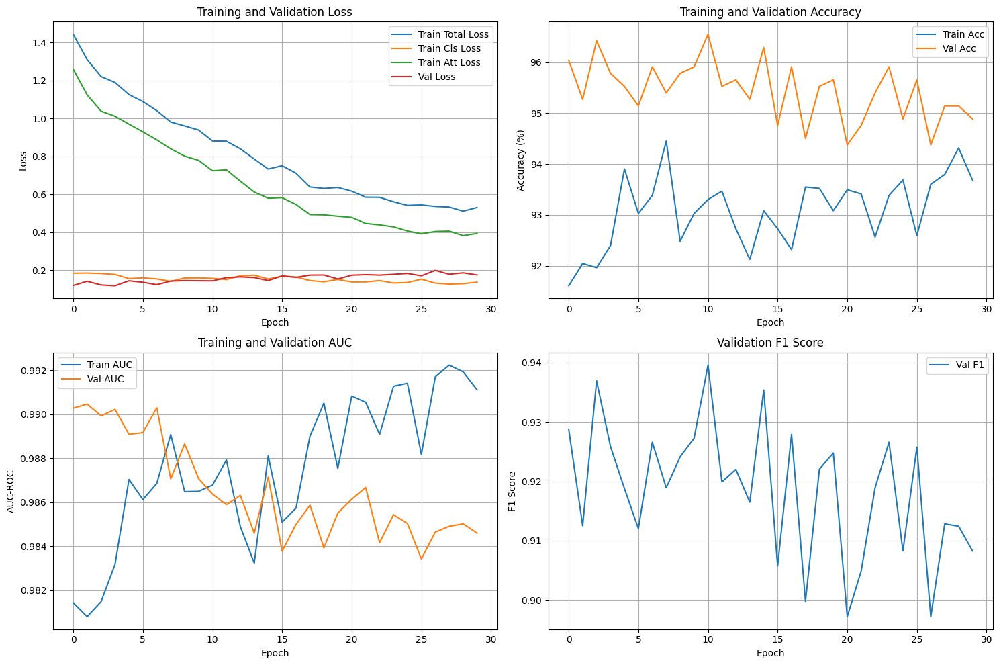

Training curves saved to 'wsod_training_history.png'


In [26]:
# ============================================================================
# PLOT TRAINING HISTORY
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Loss
axes[0, 0].plot(history['train_loss'], label='Train Total Loss')
axes[0, 0].plot(history['train_cls_loss'], label='Train Cls Loss')
axes[0, 0].plot(history['train_att_loss'], label='Train Att Loss')
axes[0, 0].plot(history['val_loss'], label='Val Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Training and Validation Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

# Accuracy
axes[0, 1].plot(history['train_acc'], label='Train Acc')
axes[0, 1].plot(history['val_acc'], label='Val Acc')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy (%)')
axes[0, 1].set_title('Training and Validation Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(True)

# AUC
axes[1, 0].plot(history['train_auc'], label='Train AUC')
axes[1, 0].plot(history['val_auc'], label='Val AUC')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('AUC-ROC')
axes[1, 0].set_title('Training and Validation AUC')
axes[1, 0].legend()
axes[1, 0].grid(True)

# F1 Score
axes[1, 1].plot(history['val_f1'], label='Val F1')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('F1 Score')
axes[1, 1].set_title('Validation F1 Score')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.savefig('wsod_training_history.png', dpi=150, bbox_inches='tight')
plt.show()

print("Training curves saved to 'wsod_training_history.png'")

In [27]:
# ============================================================================
# LOAD BEST MODEL FOR TESTING
# ============================================================================

print("\n" + "=" * 80)
print("Loading best model for testing...")
print("=" * 80)

checkpoint = torch.load(best_model_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best model from epoch {checkpoint['epoch']+1}")
print(f"Best val F1: {checkpoint['val_f1']:.4f}")


Loading best model for testing...
Loaded best model from epoch 11
Best val F1: 0.9396


In [28]:
# ============================================================================
# TEST SET EVALUATION
# ============================================================================

print("\nEvaluating on test set...")

test_loss, test_acc, test_preds, test_labels, test_probs, test_prec, test_recall, test_f1, test_auc = validate_wsod(
    model, test_loader, criterion, device
)

print("\n" + "=" * 80)
print("TEST SET RESULTS")
print("=" * 80)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.2f}%")
print(f"Test AUC-ROC: {test_auc:.4f}")
print(f"Test Precision: {test_prec:.4f}")
print(f"Test Recall: {test_recall:.4f}")
print(f"Test F1 Score: {test_f1:.4f}")

# Confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_labels, test_preds)
print("\nConfusion Matrix:")
print(cm)



Evaluating on test set...


Validation: 100%|██████████| 50/50 [00:15<00:00,  3.31it/s]


TEST SET RESULTS
Test Loss: 0.1839
Test Accuracy: 93.50%
Test AUC-ROC: 0.9770
Test Precision: 0.9029
Test Recall: 0.8571
Test F1 Score: 0.8794

Confusion Matrix:
[[548  20]
 [ 31 186]]



Generating Attention Visualizations on Test Set
Selected random indices: [304  53 146 194 444 207]


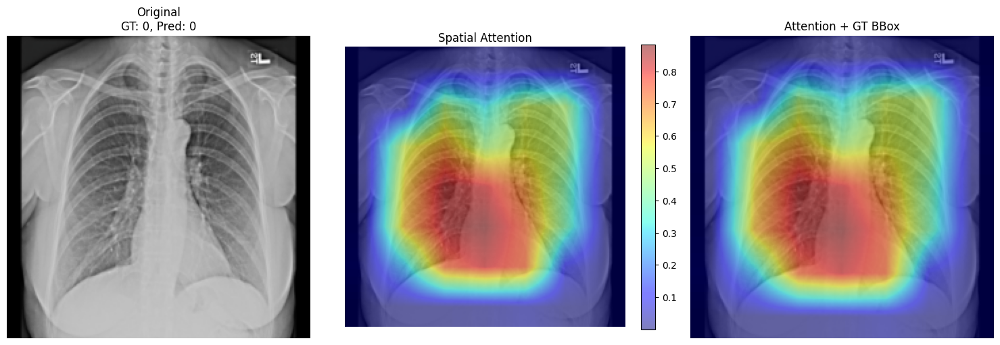

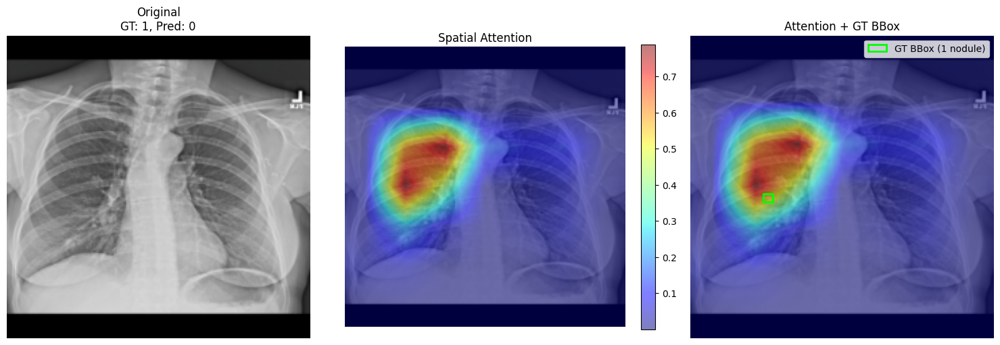

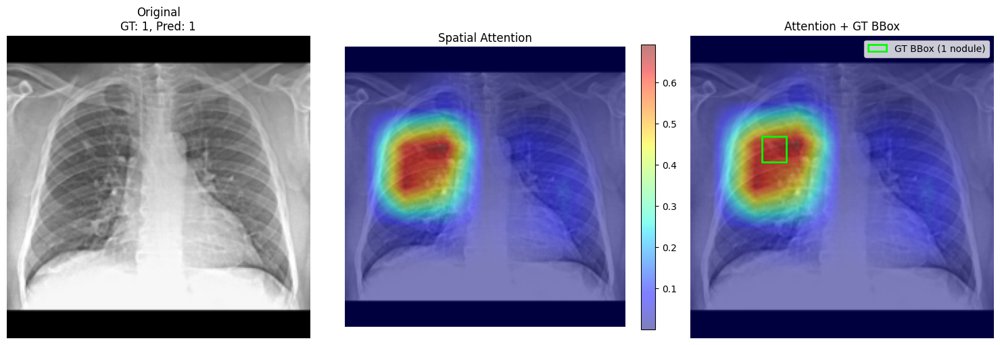

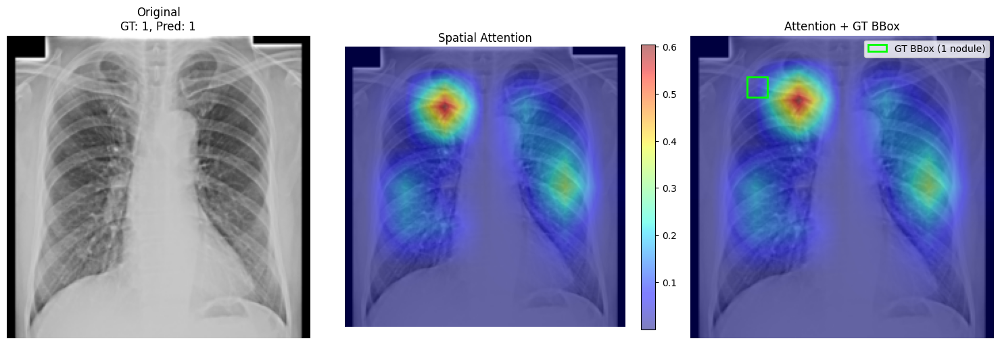

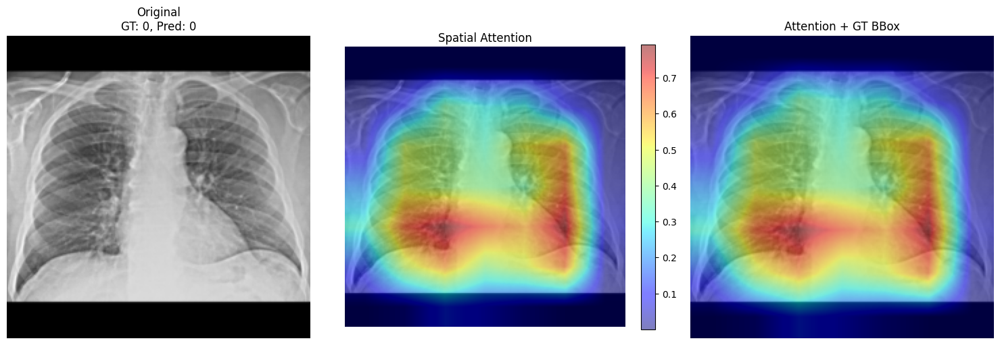

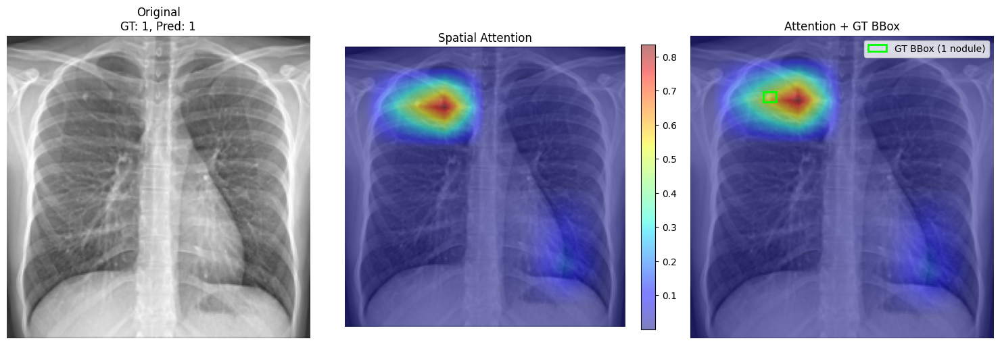


Visualized 6 random test samples with attention maps
Note: Images with multiple nodules will show one bbox per visualization


In [29]:
# ============================================================================
# VISUALIZE ATTENTION MAPS ON TEST SET
# ============================================================================

print("\n" + "=" * 80)
print("Generating Attention Visualizations on Test Set")
print("=" * 80)

model.eval()

# Get random samples from test dataset
num_samples = 6
random_indices = np.random.choice(len(test_dataset), size=num_samples, replace=False)

print(f"Selected random indices: {random_indices}")

for idx in random_indices:
    img, label, bbox = test_dataset[idx]
    
    # Get prediction
    with torch.no_grad():
        output = model(img.unsqueeze(0).to(device))
        pred = output.argmax(1).item()
    
    # Visualize
    subfig = visualize_attention_with_bbox(model, img, bbox, label, pred)
    plt.show()
    
print(f"\nVisualized {num_samples} random test samples with attention maps")
print("Note: Images with multiple nodules will show one bbox per visualization")



Finding positive samples (with nodules) for visualization...
Found 165 unique positive patients in test set
Visualizing 8 random positive patients...

Patient: n0157.mha
  Added bbox: pixel=[689, 554, 62, 73] -> norm=[0.673, 0.541, 0.061, 0.071]
  Added bbox: pixel=[775, 686, 72, 77] -> norm=[0.757, 0.670, 0.070, 0.075]
  Added bbox: pixel=[781, 410, 41, 31] -> norm=[0.763, 0.400, 0.040, 0.030]
Found 3 nodule(s)


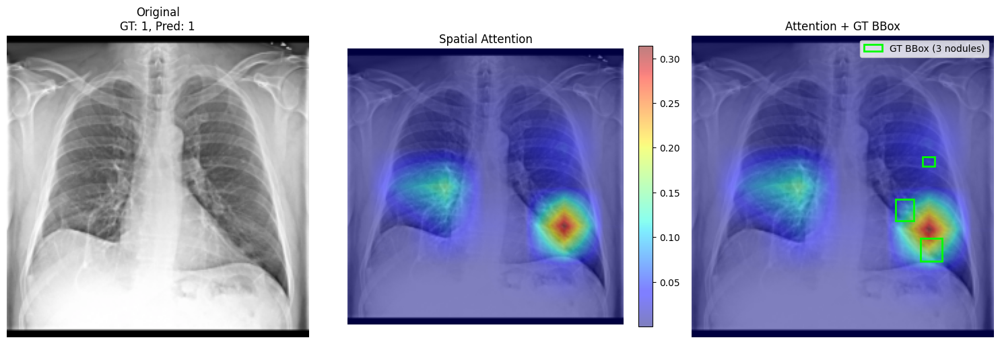


Patient: n0924.mha
  Added bbox: pixel=[752, 576, 31, 40] -> norm=[0.734, 0.562, 0.030, 0.039]
Found 1 nodule(s)


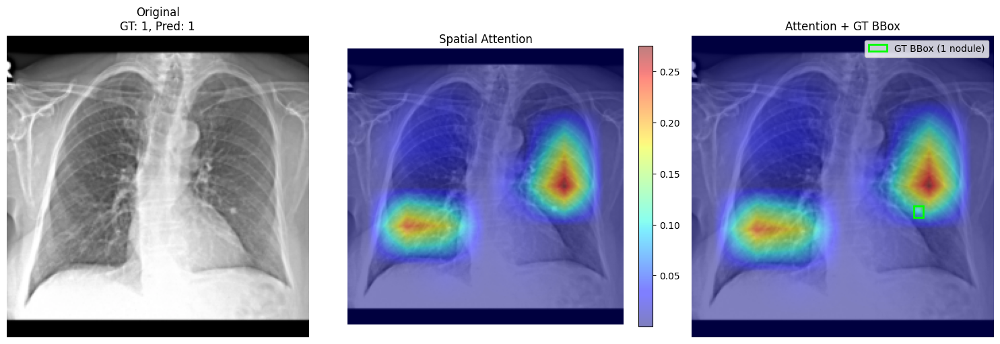


Patient: n0939.mha
  Added bbox: pixel=[893, 699, 47, 64] -> norm=[0.872, 0.683, 0.046, 0.062]
Found 1 nodule(s)


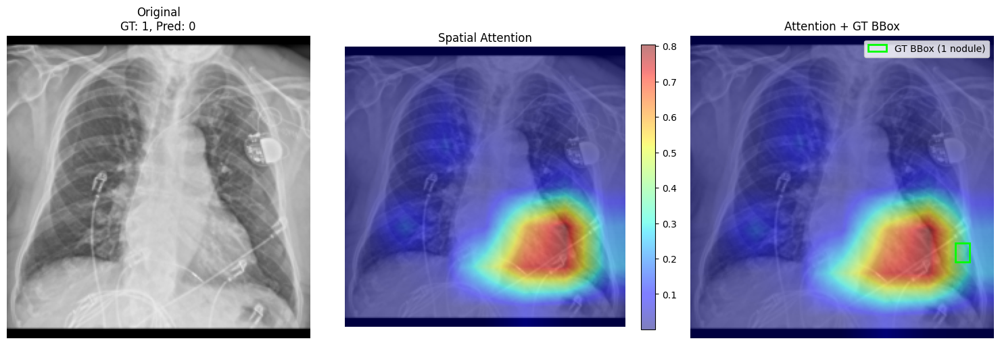


Patient: n1054.mha
  Added bbox: pixel=[198, 531, 86, 77] -> norm=[0.193, 0.519, 0.084, 0.075]
Found 1 nodule(s)


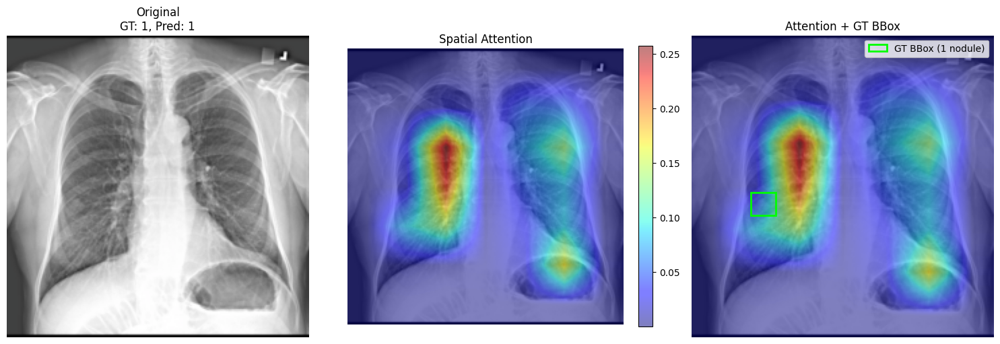


Patient: n0776.mha
  Added bbox: pixel=[203, 352, 49, 58] -> norm=[0.198, 0.344, 0.048, 0.057]
  Added bbox: pixel=[155, 461, 67, 87] -> norm=[0.151, 0.450, 0.065, 0.085]
Found 2 nodule(s)


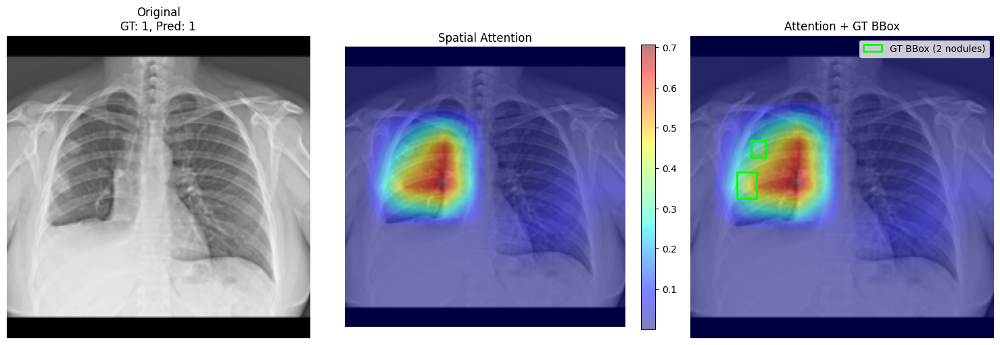


Patient: n0876.mha
  Added bbox: pixel=[314, 195, 94, 97] -> norm=[0.307, 0.190, 0.092, 0.095]
Found 1 nodule(s)


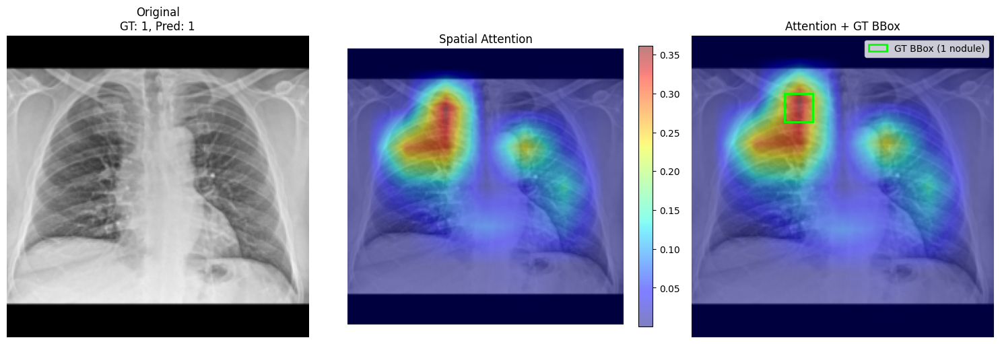


Patient: n0505.mha
  Added bbox: pixel=[276, 576, 43, 42] -> norm=[0.270, 0.562, 0.042, 0.041]
Found 1 nodule(s)


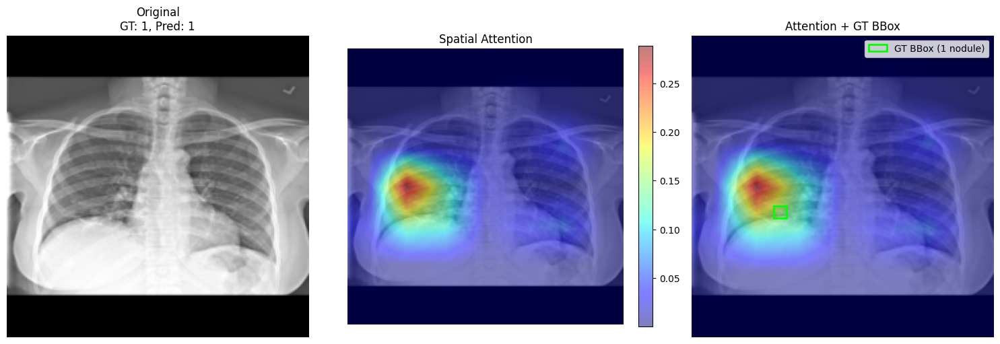


Patient: n0608.mha
  Added bbox: pixel=[193, 490, 47, 36] -> norm=[0.188, 0.479, 0.046, 0.035]
Found 1 nodule(s)


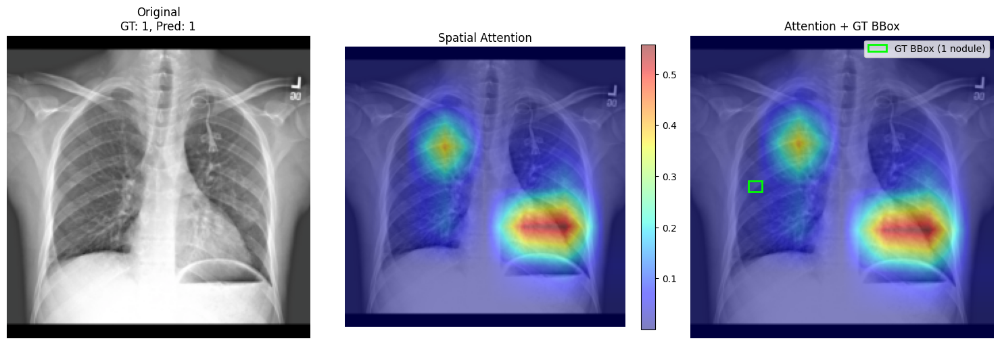


Displayed attention visualizations for 8 unique positive patients
Each visualization shows ALL nodules for that patient

WSOD Fine-tuning Complete!

Best model saved to: best_wsod_resnet50.pth
Final Test AUC: 0.9770
Final Test F1: 0.8794


In [32]:
# ============================================================================
# VISUALIZE POSITIVE SAMPLES (NODULES) - WITH MULTIPLE BBOXES PER PATIENT
# ============================================================================

print("\nFinding positive samples (with nodules) for visualization...")

# Find unique positive patients (to avoid showing same patient multiple times)
positive_patients = {}  # {img_name: first_index}
for i in range(len(test_dataset)):
    _, label, _ = test_dataset[i]
    if label == 1:
        img_name = test_df.iloc[i]['img_name']
        if img_name not in positive_patients:
            positive_patients[img_name] = i

print(f"Found {len(positive_patients)} unique positive patients in test set")

# Randomly select up to 8 unique patients
num_vis = min(8, len(positive_patients))
if num_vis > 0:
    selected_patients = np.random.choice(list(positive_patients.keys()), size=num_vis, replace=False)
    print(f"Visualizing {num_vis} random positive patients...")
    
    for patient_name in selected_patients:
        # Get the first index for this patient
        idx = positive_patients[patient_name]
        img, label, _ = test_dataset[idx]
        
        print(f"\nPatient: {patient_name}")
        
        # Find ALL bboxes for this patient from the dataframe
        patient_rows = test_df[test_df['img_name'] == patient_name]
        all_bboxes = []
        
        # Get original image dimensions (assuming square images from your dataset)
        # You may need to adjust this based on your actual image dimensions
        if 'img_width' in patient_rows.columns and 'img_height' in patient_rows.columns:
            img_width = patient_rows.iloc[0]['img_width']
            img_height = patient_rows.iloc[0]['img_height']
        else:
            # Default assumption - adjust if needed
            img_width = 1024  # Typical X-ray width
            img_height = 1024  # Typical X-ray height
        
        for _, row in patient_rows.iterrows():
            if row['label'] == 1:
                # Normalize bbox coordinates to [0, 1]
                x_norm = row['x'] / img_width
                y_norm = row['y'] / img_height
                w_norm = row['width'] / img_width
                h_norm = row['height'] / img_height
                
                bbox_tensor = torch.tensor([
                    x_norm,
                    y_norm,
                    w_norm,
                    h_norm
                ], dtype=torch.float32)
                all_bboxes.append(bbox_tensor)
                print(f"  Added bbox: pixel=[{row['x']:.0f}, {row['y']:.0f}, {row['width']:.0f}, {row['height']:.0f}] -> norm=[{x_norm:.3f}, {y_norm:.3f}, {w_norm:.3f}, {h_norm:.3f}]")
        
        print(f"Found {len(all_bboxes)} nodule(s)")
        
        # Get prediction
        with torch.no_grad():
            output = model(img.unsqueeze(0).to(device))
            pred = output.argmax(1).item()
        
        # Visualize with ALL bboxes
        subfig = visualize_attention_with_bbox(model, img, all_bboxes, label, pred)
        plt.show()
    
    print(f"\n{'='*80}")
    print(f"Displayed attention visualizations for {num_vis} unique positive patients")
    print(f"Each visualization shows ALL nodules for that patient")
else:
    print("No positive samples found in test set")

print("\n" + "=" * 80)
print("WSOD Fine-tuning Complete!")
print("=" * 80)
print(f"\nBest model saved to: {best_model_path}")
print(f"Final Test AUC: {test_auc:.4f}")
print(f"Final Test F1: {test_f1:.4f}")


Loading best model for visualization...
✓ Backbone frozen
✓ Loaded best model from epoch 11
  Val F1: 0.9396
  Val AUC: 0.9864
  Val Acc: 96.55%

Finding positive samples (with nodules) for visualization...
Found 165 unique positive patients in test set
Visualizing 8 random positive patients...

Patient: n0156.mha
  Added bbox: pixel=[321, 671, 78, 92] -> norm=[0.313, 0.655, 0.076, 0.090]
Found 1 nodule(s)


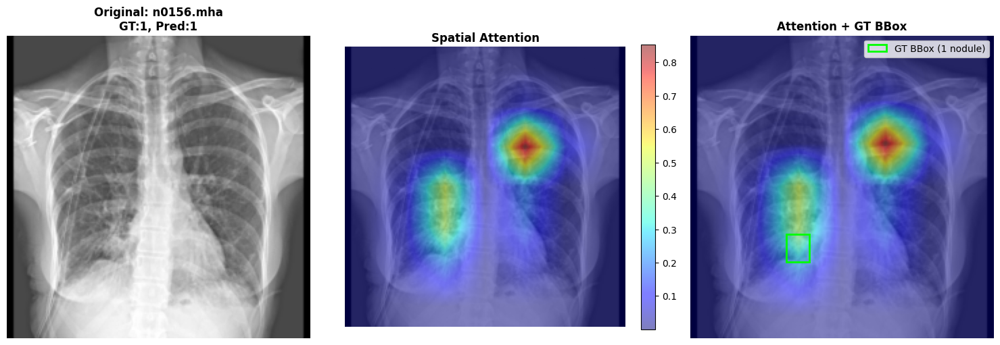


Patient: n0489.mha
  Added bbox: pixel=[169, 413, 59, 59] -> norm=[0.165, 0.403, 0.058, 0.058]
Found 1 nodule(s)


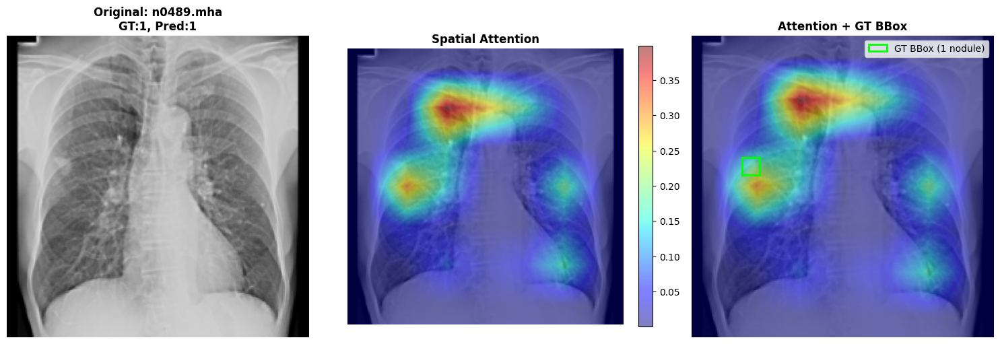


Patient: n0315.mha
  Added bbox: pixel=[771, 592, 57, 48] -> norm=[0.753, 0.578, 0.056, 0.047]
Found 1 nodule(s)


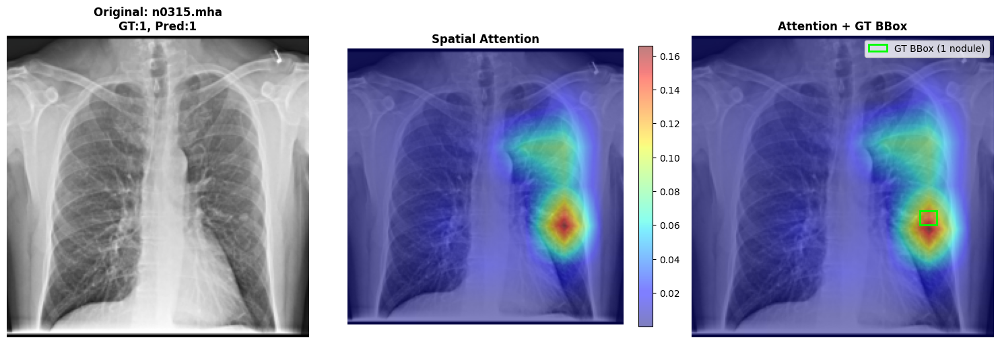


Patient: n0368.mha
  Added bbox: pixel=[175, 482, 38, 38] -> norm=[0.171, 0.471, 0.037, 0.037]
Found 1 nodule(s)


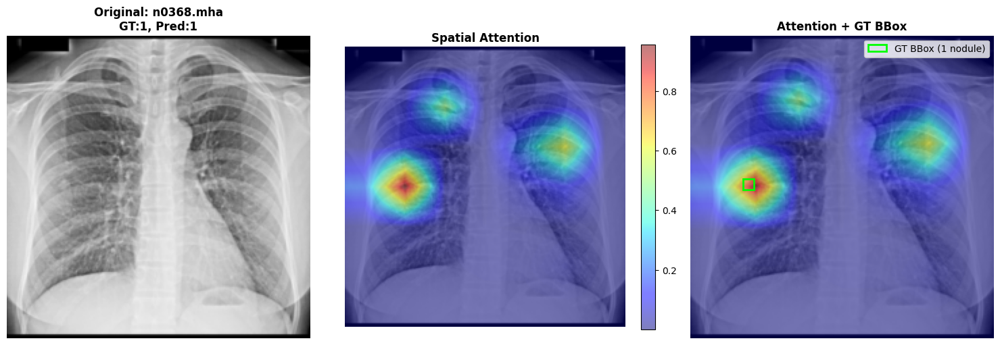


Patient: n0672.mha
  Added bbox: pixel=[202, 256, 49, 49] -> norm=[0.197, 0.250, 0.048, 0.048]
Found 1 nodule(s)


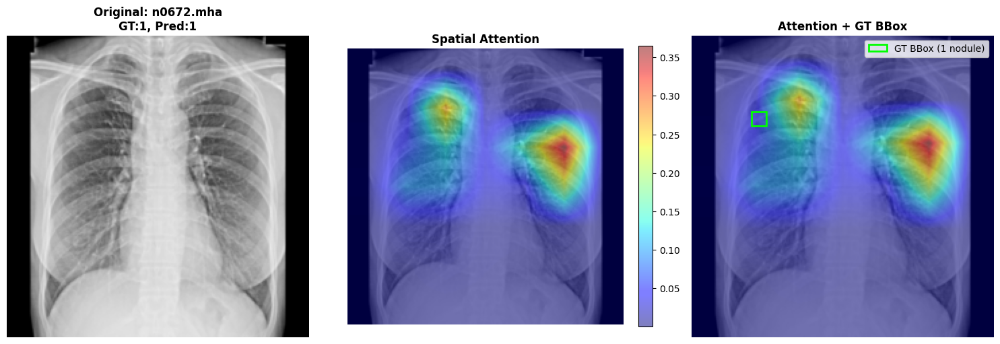


Patient: n0754.mha
  Added bbox: pixel=[397, 368, 21, 20] -> norm=[0.388, 0.359, 0.021, 0.020]
Found 1 nodule(s)


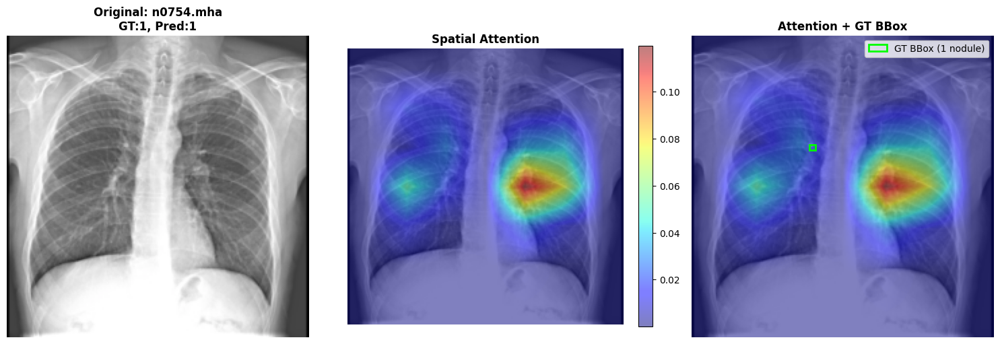


Patient: n0665.mha
  Added bbox: pixel=[660, 126, 28, 38] -> norm=[0.645, 0.123, 0.027, 0.037]
Found 1 nodule(s)


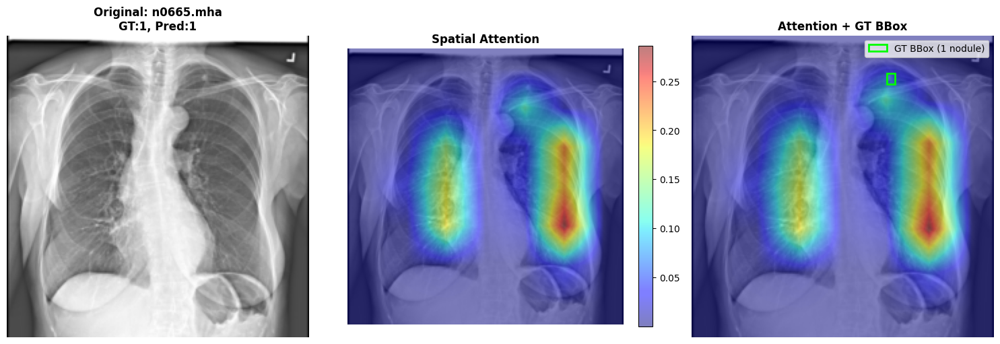


Patient: n0282.mha
  Added bbox: pixel=[718, 540, 67, 67] -> norm=[0.701, 0.527, 0.065, 0.065]
  Added bbox: pixel=[315, 267, 56, 56] -> norm=[0.308, 0.261, 0.055, 0.055]
  Added bbox: pixel=[811, 593, 67, 65] -> norm=[0.792, 0.579, 0.065, 0.063]
Found 3 nodule(s)


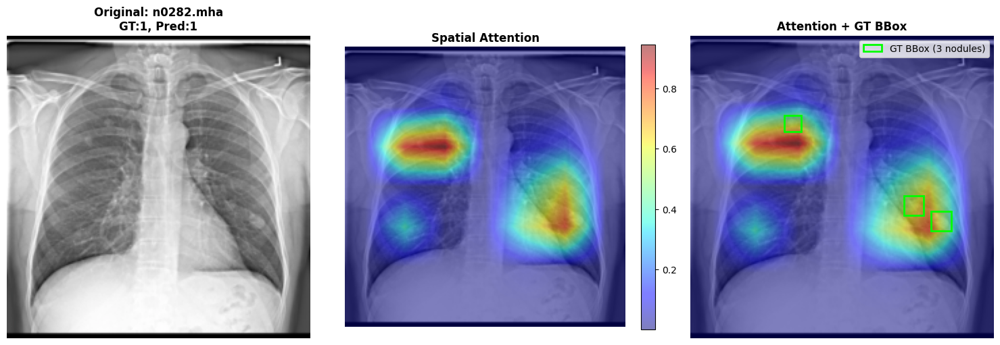


Displayed attention visualizations for 8 unique positive patients
Each visualization shows ALL nodules for that patient

Visualization Complete!


In [33]:
# ============================================================================
# LOAD BEST MODEL AND VISUALIZE POSITIVE SAMPLES (NODULES) WITH MULTIPLE BBOXES
# ============================================================================

print("\n" + "=" * 80)
print("Loading best model for visualization...")
print("=" * 80)
model = WSODModelWithAttention(base_model, num_classes=2, freeze_backbone=True).to(device)
# Load the best model checkpoint
best_model_path = './best_wsod_resnet50v2.pth'
checkpoint = torch.load(best_model_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"✓ Loaded best model from epoch {checkpoint.get('epoch', 'unknown')+1}")
print(f"  Val F1: {checkpoint.get('val_f1', 'unknown'):.4f}")
print(f"  Val AUC: {checkpoint.get('val_auc', 'unknown'):.4f}")
print(f"  Val Acc: {checkpoint.get('val_acc', 'unknown'):.2f}%")

# ============================================================================
# VISUALIZE POSITIVE SAMPLES (NODULES) - WITH MULTIPLE BBOXES PER PATIENT
# ============================================================================

print("\nFinding positive samples (with nodules) for visualization...")

# Find unique positive patients (to avoid showing same patient multiple times)
positive_patients = {}  # {img_name: first_index}
for i in range(len(test_dataset)):
    _, label, _ = test_dataset[i]
    if label == 1:
        img_name = test_df.iloc[i]['img_name']
        if img_name not in positive_patients:
            positive_patients[img_name] = i

print(f"Found {len(positive_patients)} unique positive patients in test set")

# Randomly select up to 8 unique patients
num_vis = min(8, len(positive_patients))
if num_vis > 0:
    selected_patients = np.random.choice(list(positive_patients.keys()), size=num_vis, replace=False)
    print(f"Visualizing {num_vis} random positive patients...")
    
    for patient_name in selected_patients:
        # Get the first index for this patient
        idx = positive_patients[patient_name]
        img, label, _ = test_dataset[idx]
        
        print(f"\nPatient: {patient_name}")
        
        # Find ALL bboxes for this patient from the dataframe
        patient_rows = test_df[test_df['img_name'] == patient_name]
        all_bboxes = []
        
        # Get original image dimensions (assuming square images from your dataset)
        # You may need to adjust this based on your actual image dimensions
        if 'img_width' in patient_rows.columns and 'img_height' in patient_rows.columns:
            img_width = patient_rows.iloc[0]['img_width']
            img_height = patient_rows.iloc[0]['img_height']
        else:
            # Default assumption - adjust if needed
            img_width = 1024  # Typical X-ray width
            img_height = 1024  # Typical X-ray height
        
        for _, row in patient_rows.iterrows():
            if row['label'] == 1:
                # Normalize bbox coordinates to [0, 1]
                x_norm = row['x'] / img_width
                y_norm = row['y'] / img_height
                w_norm = row['width'] / img_width
                h_norm = row['height'] / img_height
                
                bbox_tensor = torch.tensor([
                    x_norm,
                    y_norm,
                    w_norm,
                    h_norm
                ], dtype=torch.float32)
                all_bboxes.append(bbox_tensor)
                print(f"  Added bbox: pixel=[{row['x']:.0f}, {row['y']:.0f}, {row['width']:.0f}, {row['height']:.0f}] -> norm=[{x_norm:.3f}, {y_norm:.3f}, {w_norm:.3f}, {h_norm:.3f}]")
        
        print(f"Found {len(all_bboxes)} nodule(s)")
        
        # In the positive samples visualization section, update the call to include img_name
        # Get prediction
        with torch.no_grad():
            output = model(img.unsqueeze(0).to(device))
            pred = output.argmax(1).item()
        
        # Visualize with ALL bboxes and image name
        subfig = visualize_attention_with_bbox(model, img, all_bboxes, label, pred, img_name=patient_name)
        plt.show()
    
    print(f"\n{'='*80}")
    print(f"Displayed attention visualizations for {num_vis} unique positive patients")
    print(f"Each visualization shows ALL nodules for that patient")
    print(f"{'='*80}")
else:
    print("No positive samples found in test set")

print("\n" + "=" * 80)
print("Visualization Complete!")
print("=" * 80)